<a href="https://colab.research.google.com/github/Mahbubur-Rahman-Mehedi/Dataset_statistic_v1/blob/main/BiLSTM_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# === Cell 1: Setup / Install / Drive Mount ===
!pip -q install lime

import os, json, pickle, datetime
from pathlib import Path

from google.colab import drive
drive.mount('/content/drive')

# ---------- USER CONFIG ----------
# Point this to your dataset CSV with columns: 'text', 'label'
DATA_CSV = "https://raw.githubusercontent.com/Mahbubur-Rahman-Mehedi/Dataset_statistic_v1/refs/heads/main/dataset%20v1/full_dataset_refined_v8.csv"  # <-- CHANGE IF NEEDED


# RAW_URL = "https://raw.githubusercontent.com/Mahbubur-Rahman-Mehedi/Dataset_statistic_v1/refs/heads/main/dataset%20v1/full_dataset_refined_v8.csv"
# df = pd.read_csv(RAW_URL)          # If Bangla text, UTF-8 is default; specify encoding if needed
# # df = pd.read_csv(RAW_URL, encoding="utf-8")  # explicit
# df.head()

PROJECT_NAME = "hate_speech_bilstm"
RUN_ID = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
BASE_DIR = Path("/content/drive/MyDrive") / PROJECT_NAME
RUN_DIR = BASE_DIR / f"runs/{RUN_ID}"
os.makedirs(RUN_DIR, exist_ok=True)

# Files to save
TOKENIZER_PATH = RUN_DIR / "tokenizer.pkl"
LABEL_ENCODER_PATH = RUN_DIR / "label_encoder.pkl"
HISTORY_JSON = RUN_DIR / "history.json"
REPORT_JSON = RUN_DIR / "classification_report.json"
CONF_MAT_PNG = RUN_DIR / "confusion_matrix.png"
EXPLAIN_DIR = RUN_DIR / "lime_explanations"
os.makedirs(EXPLAIN_DIR, exist_ok=True)

# Log where we save this run
with open(RUN_DIR / "run_meta.json", "w") as f:
    json.dump({"run_id": RUN_ID, "data_csv": DATA_CSV}, f, indent=2)

print(f"Run folder: {RUN_DIR}")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Mounted at /content/drive
Run folder: /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946


In [8]:
# === Cell 2: Load data, split, encode labels (using new_label) ===
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Load
df = pd.read_csv(DATA_CSV)
assert {"text","new_label"}.issubset(df.columns), "CSV must contain 'text' and 'new_label' columns."

# Basic cleanup
df["text"] = df["text"].astype(str).str.strip()
df["new_label"] = df["new_label"].astype(str).str.strip()
df = df.dropna(subset=["text","new_label"]).reset_index(drop=True)

# Train/Val/Test split (stratified)
train_df, test_df = train_test_split(df, test_size=0.15, random_state=42, stratify=df["new_label"])
train_df, val_df  = train_test_split(train_df, test_size=0.15, random_state=42, stratify=train_df["new_label"])

# Label encode
le = LabelEncoder()
y_train = le.fit_transform(train_df["new_label"].values)
y_val   = le.transform(val_df["new_label"].values)
y_test  = le.transform(test_df["new_label"].values)

num_classes = len(le.classes_)
print("Classes:", list(le.classes_))
with open(LABEL_ENCODER_PATH, "wb") as f:
    pickle.dump(le, f)

print(f"Saved label encoder -> {LABEL_ENCODER_PATH}")
print(f"Train/Val/Test sizes: {len(train_df)} / {len(val_df)} / {len(test_df)}")


Classes: ['Gender-based', 'Geopolitical', 'Personal', 'Political', 'Religious', 'Sports', 'Threat']
Saved label encoder -> /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/label_encoder.pkl
Train/Val/Test sizes: 25533 / 4506 / 5301


In [9]:
# === Cell 3: Tokenize & Pad ===
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Tokenizer
MAX_WORDS = 60000     # vocab size cap
OOV_TOKEN = "<OOV>"
MAX_LEN = 128         # sequence length cap

tok = Tokenizer(num_words=MAX_WORDS, oov_token=OOV_TOKEN)
tok.fit_on_texts(train_df["text"].tolist())

X_train = pad_sequences(tok.texts_to_sequences(train_df["text"].tolist()), maxlen=MAX_LEN, padding="post", truncating="post")
X_val   = pad_sequences(tok.texts_to_sequences(val_df["text"].tolist()),   maxlen=MAX_LEN, padding="post", truncating="post")
X_test  = pad_sequences(tok.texts_to_sequences(test_df["text"].tolist()),  maxlen=MAX_LEN, padding="post", truncating="post")

with open(TOKENIZER_PATH, "wb") as f:
    pickle.dump(tok, f)
print(f"Saved tokenizer -> {TOKENIZER_PATH}")
print("Shapes:", X_train.shape, X_val.shape, X_test.shape)


Saved tokenizer -> /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/tokenizer.pkl
Shapes: (25533, 128) (4506, 128) (5301, 128)


In [10]:
# === Cell 4: Build BiLSTM model ===
import tensorflow as tf
from tensorflow.keras import layers, models

tf.keras.utils.set_random_seed(42)

EMBED_DIM = 128
LSTM_UNITS = 128
DENSE_UNITS = 128
DROPOUT = 0.3

inputs = layers.Input(shape=(X_train.shape[1],))
x = layers.Embedding(input_dim=min(MAX_WORDS, len(tok.word_index)+1),
                     output_dim=EMBED_DIM,
                     input_length=X_train.shape[1])(inputs)
x = layers.SpatialDropout1D(0.2)(x)
x = layers.Bidirectional(layers.LSTM(LSTM_UNITS, return_sequences=True))(x)
# Combine global max and average pooling for robust signals
x_max = layers.GlobalMaxPooling1D()(x)
x_avg = layers.GlobalAveragePooling1D()(x)
x = layers.Concatenate()([x_max, x_avg])
x = layers.Dense(DENSE_UNITS, activation="relu")(x)
x = layers.Dropout(DROPOUT)(x)
outputs = layers.Dense(num_classes, activation="softmax")(x)

model = models.Model(inputs, outputs)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-3),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

model.summary()


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 128, 128)  │  5,492,224 │ input_layer_1[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d_1 │ (None, 128, 128)  │          0 │ embedding_1[0][0] │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 128, 256)  │    263,168 │ spatial_dropout1… │
│ (Bidirectional)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 256)       │          0 │ bidirectional_1[… │
│ (GlobalMaxPooling1… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 256)       │          0 │ bidirectional_1[… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 512)       │          0 │ global_max_pooli… │
│ (Concatenate)       │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 128)       │     65,664 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 7)         │        903 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,821,959 (22.21 MB)

 Trainable params: 5,821,959 (22.21 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
# === Cell 5: Train & save history ===
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

BEST_MODEL_PATH = str(RUN_DIR / "model_bilstm_best.keras")  # Keras v3 format
es = EarlyStopping(monitor="val_accuracy", patience=5, mode="max", restore_best_weights=True)
mc = ModelCheckpoint(BEST_MODEL_PATH, monitor="val_accuracy", mode="max", save_best_only=True, verbose=1)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    batch_size=128,
    epochs=20,
    callbacks=[es, mc],
    verbose=1
)

# Save history
with open(HISTORY_JSON, "w") as f:
    json.dump({k: [float(x) for x in v] for k, v in history.history.items()}, f, indent=2)

print(f"Best model saved -> {BEST_MODEL_PATH}")
print(f"History saved -> {HISTORY_JSON}")


Epoch 1/20
199/200 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9980 - loss: 0.0079
Epoch 1: val_accuracy improved from -inf to 0.96338, saving model to /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/model_bilstm_best.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.9980 - loss: 0.0079 - val_accuracy: 0.9634 - val_loss: 0.2709
Epoch 2/20
199/200 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.9986 - loss: 0.0056
Epoch 2: val_accuracy did not improve from 0.96338
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.9986 - loss: 0.0056 - val_accuracy: 0.9625 - val_loss: 0.2536
Epoch 3/20
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9983 - loss: 0.0057
Epoch 3: val_accuracy improved from 0.96338 to 0.96427, saving model to /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/model_bilstm_best.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - accuracy: 0.9983 - loss: 0.0057 - val_accuracy: 0.9643 - val_loss: 0.2642
Epoch 4/20
199/200 

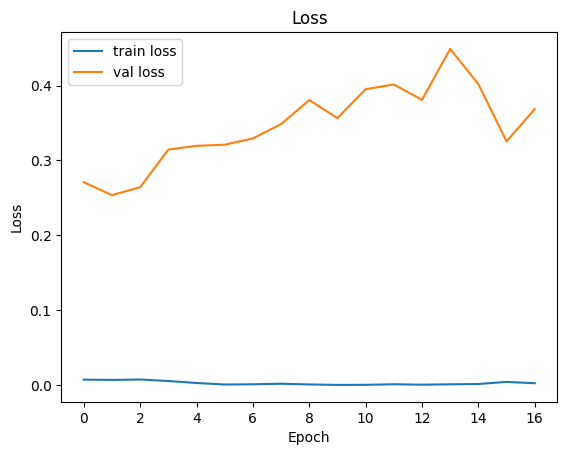

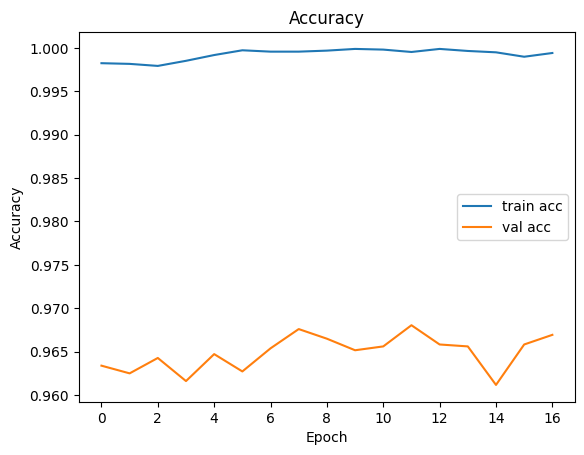

In [14]:
# === Cell 6: Plot learning curves (optional) ===
import matplotlib.pyplot as plt
import json

with open(HISTORY_JSON) as f:
    hist = json.load(f)

plt.figure()
plt.plot(hist["loss"], label="train loss")
plt.plot(hist["val_loss"], label="val loss")
plt.legend()
plt.title("Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.show()

plt.figure()
plt.plot(hist["accuracy"], label="train acc")
plt.plot(hist["val_accuracy"], label="val acc")
plt.legend()
plt.title("Accuracy")
plt.xlabel("Epoch"); plt.ylabel("Accuracy")
plt.show()


In [15]:
# === Cell 7: Evaluate & save report ===
import numpy as np
from sklearn.metrics import classification_report, accuracy_score

# Evaluate on test
probs = model.predict(X_test, batch_size=256, verbose=0)
y_pred = np.argmax(probs, axis=1)

acc = accuracy_score(y_test, y_pred)
report_dict = classification_report(y_test, y_pred, target_names=list(le.classes_), output_dict=True)
report_dict["overall_accuracy"] = acc

with open(REPORT_JSON, "w") as f:
    json.dump(report_dict, f, indent=2)

print(f"Overall accuracy: {acc:.4f}\n")
print(classification_report(y_test, y_pred, target_names=list(le.classes_)))
print(f"\nSaved detailed report -> {REPORT_JSON}")


Overall accuracy: 0.9704

              precision    recall  f1-score   support

Gender-based       0.97      0.94      0.95       832
Geopolitical       0.98      0.96      0.97       325
    Personal       0.97      0.99      0.98      3295
   Political       0.97      0.96      0.97       231
   Religious       0.99      0.95      0.97       313
      Sports       0.96      0.84      0.90        95
      Threat       0.95      0.88      0.91       210

    accuracy                           0.97      5301
   macro avg       0.97      0.93      0.95      5301
weighted avg       0.97      0.97      0.97      5301


Saved detailed report -> /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/classification_report.json


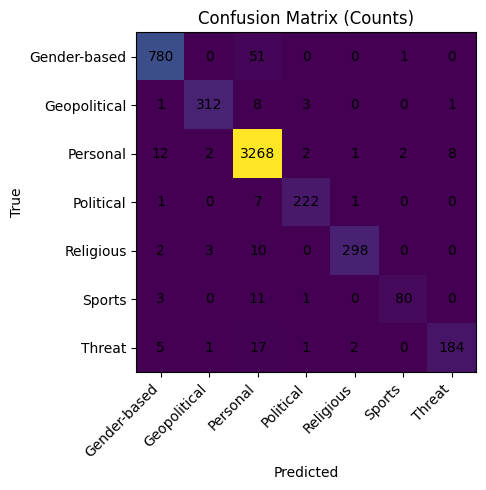

Saved confusion matrix PNG -> /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/confusion_matrix.png


In [16]:
# === Cell 8: Confusion Matrix (counts) ===
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)  # raw counts

plt.figure(figsize=(6, 5))
plt.imshow(cm)  # default colormap, count-wise
plt.title("Confusion Matrix (Counts)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(num_classes), labels=list(le.classes_), rotation=45, ha='right')
plt.yticks(ticks=np.arange(num_classes), labels=list(le.classes_))
# annotate counts
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, cm[i, j], ha="center", va="center")
plt.tight_layout()
plt.savefig(CONF_MAT_PNG, dpi=150)
plt.show()

print(f"Saved confusion matrix PNG -> {CONF_MAT_PNG}")


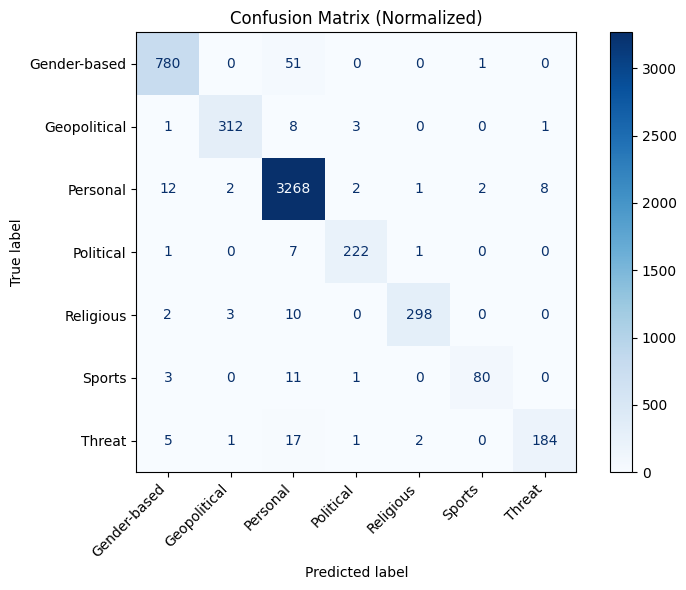

In [19]:
# === Cell 8 (cont.): Confusion Matrix (display with ConfusionMatrixDisplay) ===
from sklearn.metrics import ConfusionMatrixDisplay

# Display the confusion matrix with labels
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(le.classes_))

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax)
plt.title("Confusion Matrix (Normalized)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [17]:
# === Cell 9: LIME Text explanations ===
from lime.lime_text import LimeTextExplainer
from IPython.display import HTML, display

# Wrapper for LIME: texts -> proba
def predict_proba_for_lime(texts):
    seqs = pad_sequences(tok.texts_to_sequences(texts), maxlen=X_train.shape[1], padding="post", truncating="post")
    return model.predict(seqs, verbose=0)

class_names = list(le.classes_)
explainer = LimeTextExplainer(class_names=class_names)

# Choose up to 2 samples per class from test set (feel free to change)
samples_per_class = 2
saved_files = []

for cls_idx, cls_name in enumerate(class_names):
    cls_test_idx = np.where(y_test == cls_idx)[0]
    if len(cls_test_idx) == 0:
        continue
    pick = np.random.choice(cls_test_idx, size=min(samples_per_class, len(cls_test_idx)), replace=False)
    for k, idx in enumerate(pick):
        raw_text = test_df.iloc[idx]["text"]
        exp = explainer.explain_instance(raw_text, predict_proba_for_lime, num_features=10, labels=[cls_idx])
        html_path = EXPLAIN_DIR / f"lime_{cls_name}_{k}.html"
        exp.save_to_file(str(html_path))
        saved_files.append(str(html_path))

        # Display first explanation of each class inline for quick sanity check
        if k == 0:
            display(HTML(exp.as_html()))

print("Saved LIME HTML files:")
for p in saved_files:
    print(" -", p)


Saved LIME HTML files:
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Gender-based_0.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Gender-based_1.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Geopolitical_0.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Geopolitical_1.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Personal_0.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Personal_1.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Political_0.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Political_1.html
 - /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations/lime_Religious_0.html
 - /content/d

In [18]:
# === Cell 10: Artifact summary ===
print("Artifacts saved in this run:")
print("RUN_DIR:", RUN_DIR)
print(" - Best model:", RUN_DIR / "model_bilstm_best.keras")
print(" - Tokenizer:", TOKENIZER_PATH)
print(" - Label encoder:", LABEL_ENCODER_PATH)
print(" - History:", HISTORY_JSON)
print(" - Report (JSON):", REPORT_JSON)
print(" - Confusion matrix (PNG):", CONF_MAT_PNG)
print(" - LIME explanations (HTML in folder):", EXPLAIN_DIR)


Artifacts saved in this run:
RUN_DIR: /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946
 - Best model: /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/model_bilstm_best.keras
 - Tokenizer: /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/tokenizer.pkl
 - Label encoder: /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/label_encoder.pkl
 - History: /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/history.json
 - Report (JSON): /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/classification_report.json
 - Confusion matrix (PNG): /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/confusion_matrix.png
 - LIME explanations (HTML in folder): /content/drive/MyDrive/hate_speech_bilstm/runs/20250926_125946/lime_explanations
